In [1]:
import sys
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
# Add the parent directory to the Python path
sys.path.append(str(Path().resolve().parent))
import utils
import trainer
import evaluator
import data_process
import motion_blur

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [3]:
input_size = 448

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size, img_dir=os.path.join('..', data_process.img_dir), ann_dir=os.path.join('..', data_process.ann_dir))   

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural', 'kernel_path': '../data/motion_blur_data'})

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



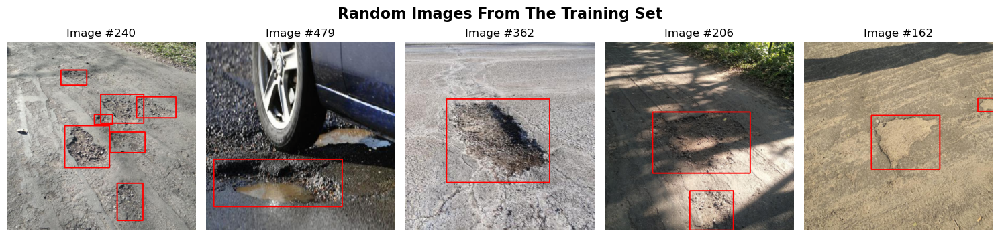

In [4]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

In [5]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="../data/models/fcos_resnet50_fpn/fcos_resnet50_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/fcos_resnet50_fpn", kornia_aug=False)

Starting training for fcos_resnet50_fpn with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.00017706784246894727, 'beta1': 0.9634396789345582, 'beta2': 0.9177747811929413, 'scheduler': 'OneCycleLR', 'max_lr': 0.0018099558447350662}
Epoch 1/100, Train Loss: 94.0421, Val mAP@50: 0.3156, FPS: 57.23, Epoch Time: 21.39 seconds
Epoch 2/100, Train Loss: 71.4108, Val mAP@50: 0.4031, FPS: 57.90, Epoch Time: 21.17 seconds
Epoch 3/100, Train Loss: 64.2071, Val mAP@50: 0.5632, FPS: 56.26, Epoch Time: 21.09 seconds
Epoch 4/100, Train Loss: 59.9456, Val mAP@50: 0.5101, FPS: 57.44, Epoch Time: 21.09 seconds
Epoch 5/100, Train Loss: 54.9398, Val mAP@50: 0.5989, FPS: 55.52, Epoch Time: 21.30 seconds
Epoch 6/100, Train Loss: 51.1088, Val mAP@50: 0.5940, FPS: 57.60, Epoch Time: 21.19 seconds
Epoch 7/100, Train Loss: 48.1946, Val mAP@50: 0.5798, FPS: 60.41, Epoch Time: 20.68 seconds
Epoch 8/100, Train Loss: 45.6303, Val mAP@50: 0.53

Mean Average Precision @ 0.5 : 0.5425 FPS: 54.25


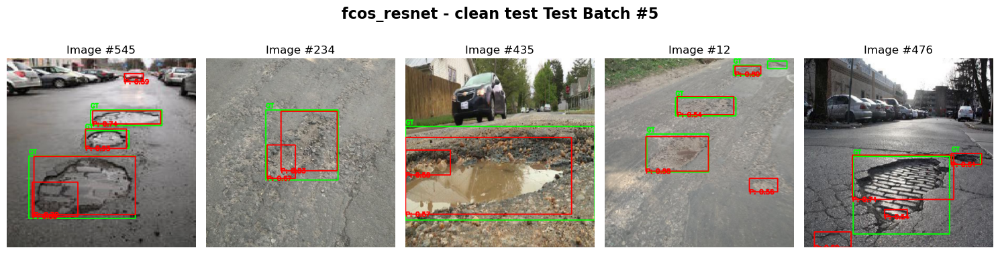

Mean Average Precision @ 0.5 : 0.4605 FPS: 53.53


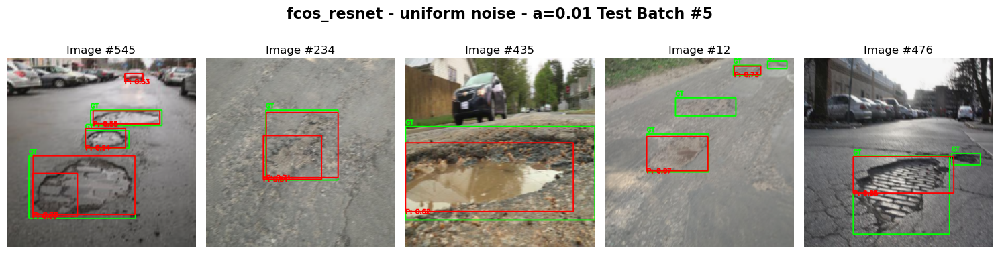

Mean Average Precision @ 0.5 : 0.1616 FPS: 53.58


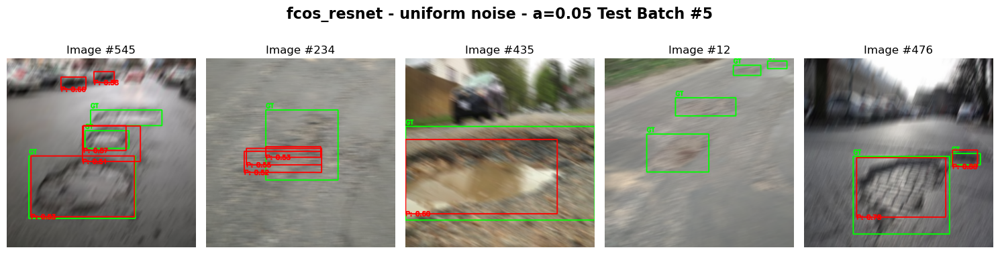

Mean Average Precision @ 0.5 : 0.0579 FPS: 53.96


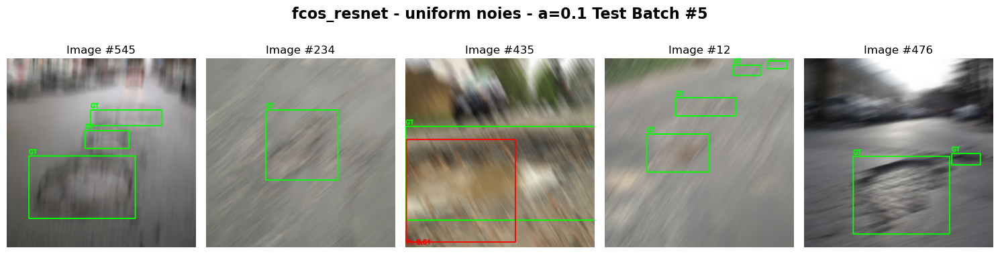

Mean Average Precision @ 0.5 : 0.4732 FPS: 53.50


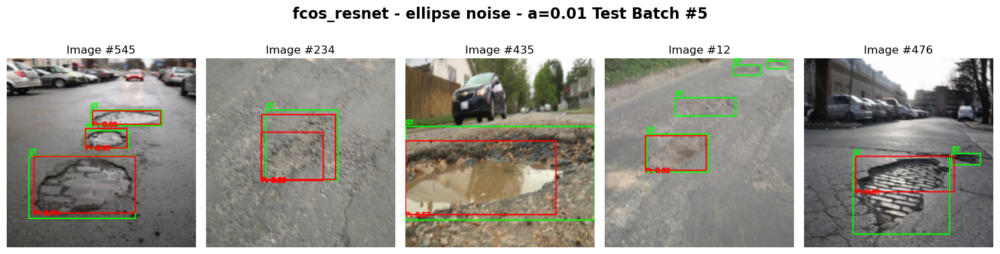

Mean Average Precision @ 0.5 : 0.1624 FPS: 53.55


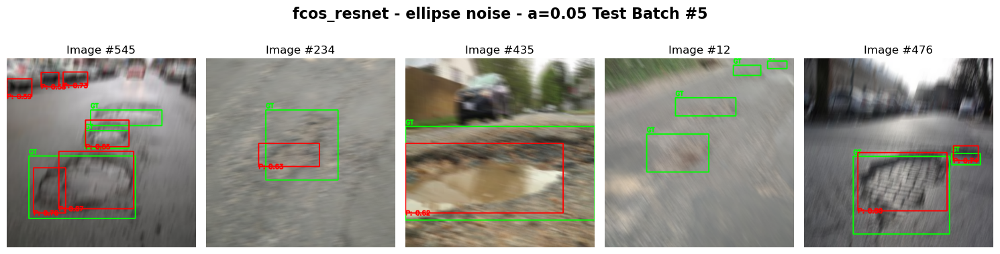

Mean Average Precision @ 0.5 : 0.0576 FPS: 54.10


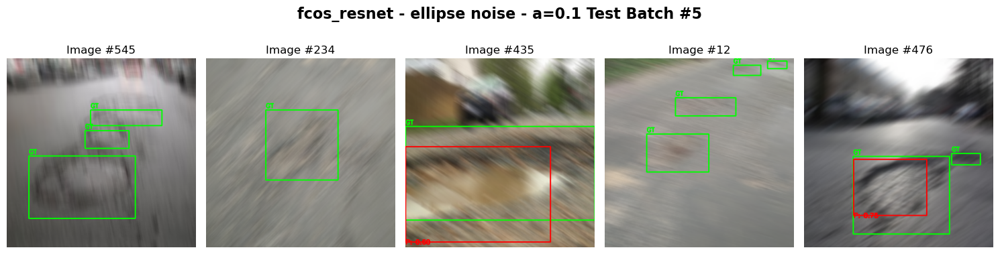

Mean Average Precision @ 0.5 : 0.3850 FPS: 53.61


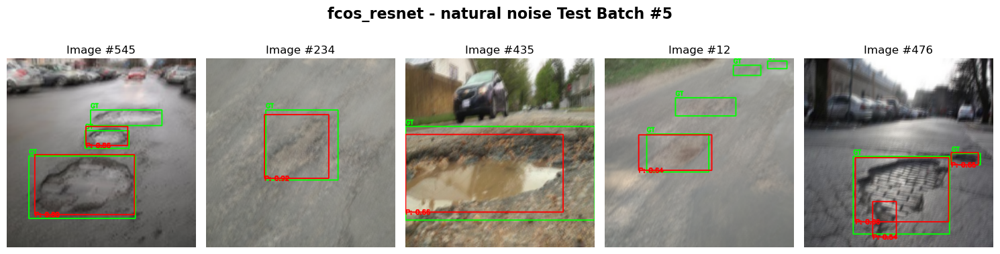

In [6]:
model_name = "fcos_resnet50_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/fcos_resnet50_fpn/fcos_resnet50_fpn_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fcos_resnet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fcos_resnet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fcos_resnet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fcos_resnet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fcos_resnet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fcos_resnet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fcos_resnet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fcos_resnet - natural noise")

In [7]:
# save history to .json file
utils.update_json(history, model_name="fcos_resnet", save_path="../")

In [8]:
# Train with data augmentation:
trainer.train_from_config(model_config_path="../data/models/fcos_resnet50_fpn/fcos_resnet50_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/fcos_resnet50_fpn", kornia_aug=True)

Starting training for fcos_resnet50_fpn with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.00017706784246894727, 'beta1': 0.9634396789345582, 'beta2': 0.9177747811929413, 'scheduler': 'OneCycleLR', 'max_lr': 0.0018099558447350662}
Epoch 1/100, Train Loss: 86.3084, Val mAP@50: 0.3764, FPS: 61.79, Epoch Time: 20.19 seconds
Epoch 2/100, Train Loss: 74.2230, Val mAP@50: 0.5319, FPS: 60.61, Epoch Time: 20.02 seconds
Epoch 3/100, Train Loss: 71.5846, Val mAP@50: 0.4315, FPS: 62.57, Epoch Time: 19.93 seconds
Epoch 4/100, Train Loss: 65.9952, Val mAP@50: 0.5405, FPS: 60.29, Epoch Time: 20.35 seconds
Epoch 5/100, Train Loss: 63.9542, Val mAP@50: 0.6124, FPS: 60.23, Epoch Time: 20.17 seconds
Epoch 6/100, Train Loss: 63.9233, Val mAP@50: 0.4715, FPS: 61.44, Epoch Time: 20.08 seconds
Epoch 7/100, Train Loss: 59.6314, Val mAP@50: 0.6120, FPS: 61.25, Epoch Time: 20.18 seconds
Epoch 8/100, Train Loss: 59.6194, Val mAP@50: 0.54

{'train_losses': [86.30835175514221,
  74.22304964065552,
  71.58456158638,
  65.99519556760788,
  63.95419293642044,
  63.92332696914673,
  59.631398260593414,
  59.61939162015915,
  55.51501888036728,
  55.84437221288681,
  54.53926134109497,
  51.790578722953796,
  51.59039497375488,
  50.28750777244568,
  50.22101831436157,
  50.449687361717224,
  48.74116986989975,
  49.26891630887985,
  48.514700055122375,
  49.51841843128204,
  48.04381173849106,
  48.71810990571976,
  47.866297364234924,
  47.25176566839218,
  45.62536495923996,
  46.46244865655899,
  46.58052450418472,
  47.48889833688736,
  46.33916646242142,
  44.91134989261627,
  45.12111043930054,
  44.87631458044052,
  44.87467485666275,
  43.48871463537216,
  46.35827708244324,
  44.59546762704849,
  43.855240523815155,
  44.842918157577515,
  45.146964728832245,
  44.72783833742142,
  44.570164263248444,
  43.92198020219803,
  43.92766922712326,
  44.039508044719696,
  44.25024056434631,
  43.82314944267273,
  42.622845

Mean Average Precision @ 0.5 : 0.5726 FPS: 53.78


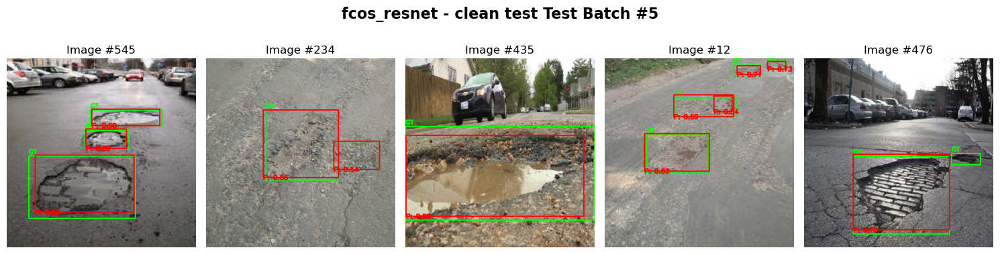

Mean Average Precision @ 0.5 : 0.5476 FPS: 53.63


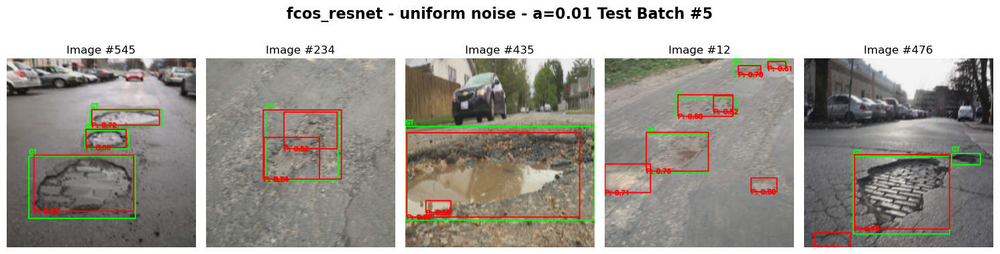

Mean Average Precision @ 0.5 : 0.4616 FPS: 53.43


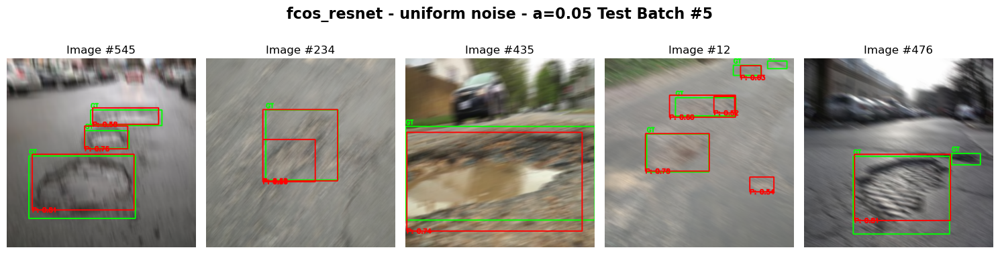

Mean Average Precision @ 0.5 : 0.3204 FPS: 53.29


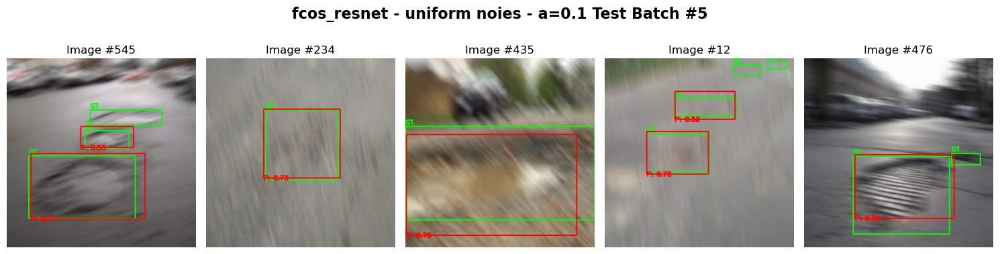

Mean Average Precision @ 0.5 : 0.5110 FPS: 53.61


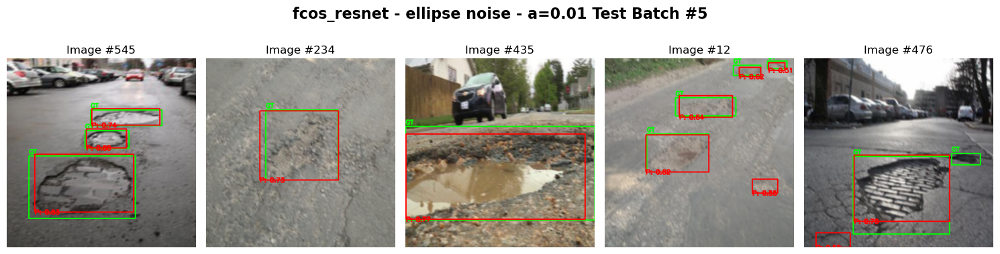

Mean Average Precision @ 0.5 : 0.4222 FPS: 53.46


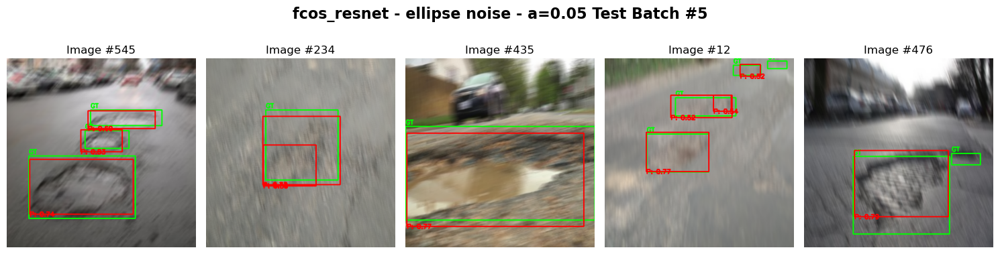

Mean Average Precision @ 0.5 : 0.2778 FPS: 53.59


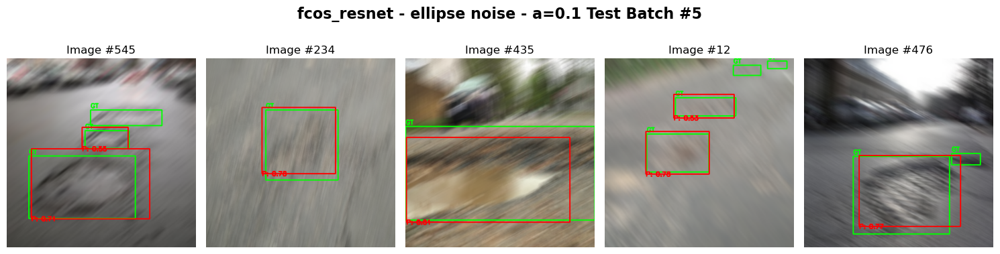

Mean Average Precision @ 0.5 : 0.4337 FPS: 53.90


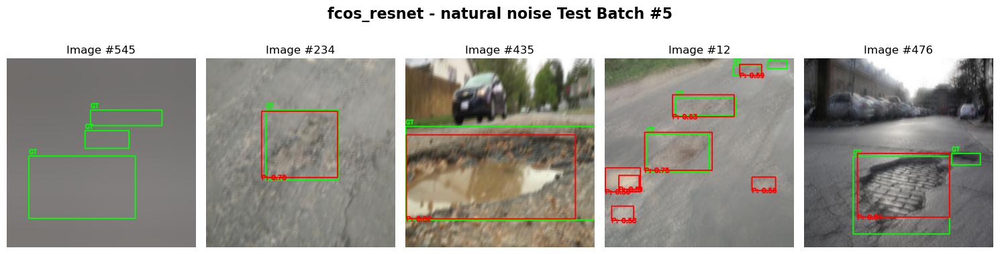

In [9]:
model_name = "fcos_resnet50_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/fcos_resnet50_fpn/fcos_resnet50_fpn_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fcos_resnet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fcos_resnet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fcos_resnet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fcos_resnet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fcos_resnet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fcos_resnet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fcos_resnet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fcos_resnet - natural noise")

In [10]:
# save history to .json file
utils.update_json(history, model_name="fcos_resnet_aug", save_path="../")